Plots of the Power Spectral Density (PSD) for both epileptic and non-epileptic channels are presented. Results are obtained by considering the PSD, normalized PSD, the integral of the PSD calculated for each 1 Hz range, and the normalized integral. These plots are shown in both linear and logarithmic scales

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import math
import csv
import os
import random

In [2]:
#GRAPHICAL SETTINGS
sns.set_style('whitegrid') # darkgrid, white grid, dark, white and ticks
plt.rc('axes', titlesize=15)     # fontsize of the axes title
plt.rc('axes', labelsize=10)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=9)    # fontsize of the tick labels
plt.rc('ytick', labelsize=9)    # fontsize of the tick labels
plt.rc('legend', fontsize=13)    # legend fontsize
plt.rcParams['lines.linewidth'] = 0.5
plt.rc('font', size=13)          # controls default text sizes

In [3]:
folder_path_epi= 'psd_epi'
# Leggi tutti i file nella cartella
filenames_epi = sorted([f for f in os.listdir(folder_path_epi) if f.endswith('.csv')], key=lambda x: int(x.split('_')[0]) if x.split('_')[0].isdigit() else float('inf'))

# Crea un DataFrame vuoto per memorizzare tutti i dati
all_data = pd.DataFrame()

In [4]:
folder_path_non_epi = 'psd_non_epi'
# Leggi tutti i file nella cartella
filenames_non = sorted([f for f in os.listdir(folder_path_non_epi) if f.endswith('.csv')], key=lambda x: int(x.split('_')[0]) if x.split('_')[0].isdigit() else float('inf'))

# Crea un DataFrame vuoto per memorizzare tutti i dati
all_data = pd.DataFrame()


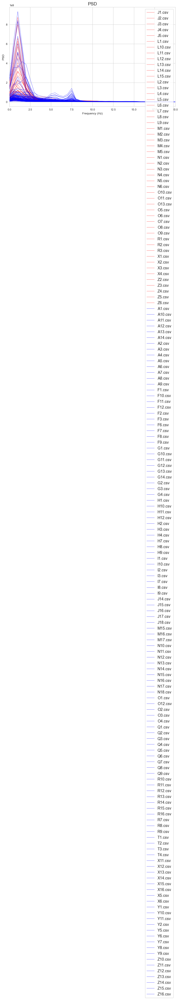

In [5]:
# Definisci i percorsi delle cartelle
folder_paths = ['psd_epi', 'psd_non_epi']

# Crea un dizionario di colori per i gruppi
colori_gruppi = {'psd_epi': 'red', 'psd_non_epi': 'blue'}

plt.figure(figsize=(10, 6))  # Imposta la dimensione del grafico

# Itera su entrambe le cartelle
for folder_path in folder_paths:
    # Leggi tutti i file nella cartella
    filenames = sorted([f for f in os.listdir(folder_path) if f.endswith('.csv')], key=lambda x: int(x.split('_')[0]) if x.split('_')[0].isdigit() else float('inf'))

    # Ottieni il colore per il gruppo corrente
    colore_gruppo = colori_gruppi[folder_path]

    # Itera su tutti i file
    for filename in filenames:
        file_path = os.path.join(folder_path, filename)

        # Controlla se il file è vuoto
        if os.path.getsize(file_path) == 0:
            print(f"Il file {filename} è vuoto")
            continue

        # Leggi il file CSV
        df = pd.read_csv(file_path)

        # Filtra i dati per mostrare solo gli integrali superiori a zero
        data_filtrata = df[df['Frequenza'] <150].copy()
        
        # Crea un grafico a barre con i dati filtrati
        plt.plot(data_filtrata['Frequenza'], data_filtrata['PSD'], label=filename, color=colore_gruppo)

# Imposta le etichette degli assi
plt.xlabel('Frequency (Hz)')
plt.ylabel('PSD')
plt.xlim(0,20)
# Imposta il titolo del grafico
plt.title('PSD')

# Aggiungi una legenda
plt.legend()

# Mostra il grafico
plt.show()


In [ ]:

# Itera su entrambe le cartelle
for folder_path in folder_paths:
    # Leggi tutti i file nella cartella
    filenames = sorted([f for f in os.listdir(folder_path) if f.endswith('.csv')], key=lambda x: int(x.split('_')[0]) if x.split('_')[0].isdigit() else float('inf'))

    # Ottieni il colore per il gruppo corrente
    colore_gruppo = colori_gruppi[folder_path]

    # Itera su tutti i file
    for filename in filenames:
        file_path = os.path.join(folder_path, filename)

        # Controlla se il file è vuoto
        if os.path.getsize(file_path) == 0:
            print(f"Il file {filename} è vuoto")
            continue

        # Leggi il file CSV
        df = pd.read_csv(file_path)

        # Filtra i dati per mostrare solo le frequenze inferiori a 30 Hz
        data_filtrata = df[df['Frequenza'] < 30]

        # Crea un grafico con i dati filtrati
        plt.plot(data_filtrata['Frequenza'], data_filtrata['PSD'], label=filename, color=colore_gruppo)

# Imposta le etichette degli assi
plt.xlabel('Frequenza (Hz)')
plt.ylabel('PSD')

# Imposta il titolo del grafico
plt.title('PSD per ciascun gruppo')

# Aggiungi una legenda
plt.legend()

# Mostra il grafico
plt.show()


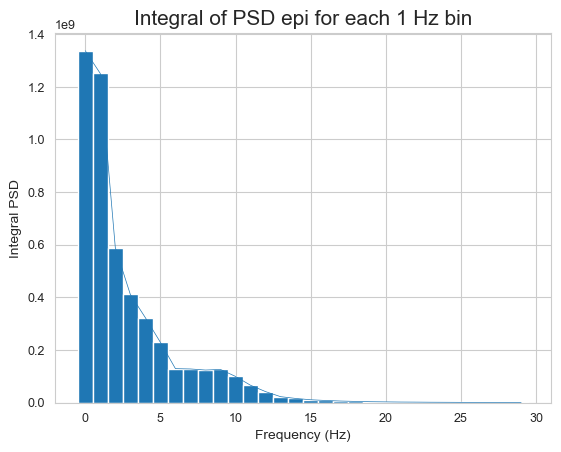

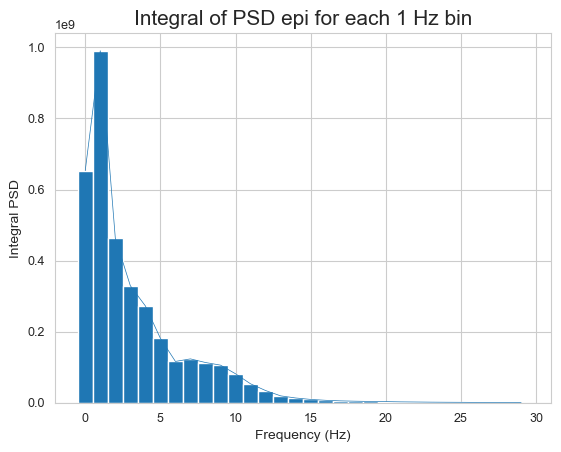

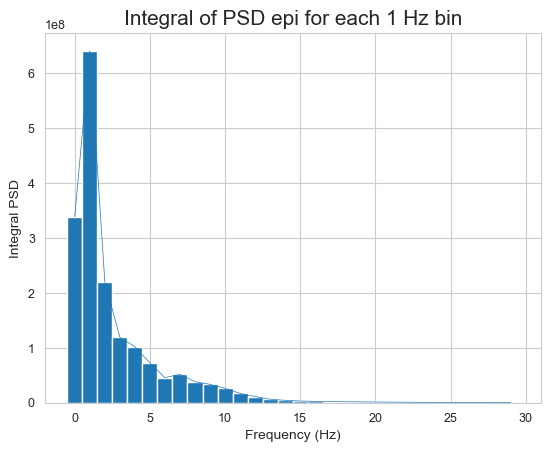

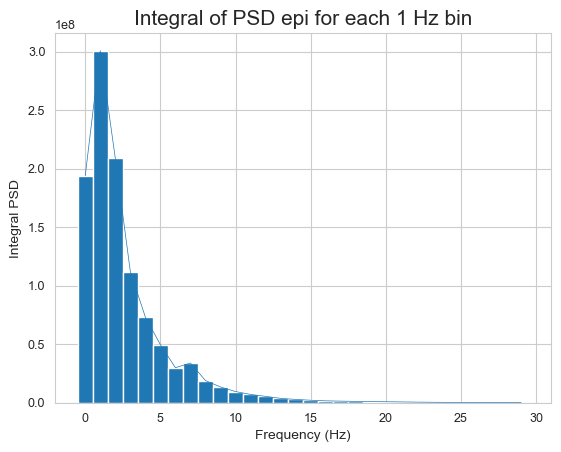

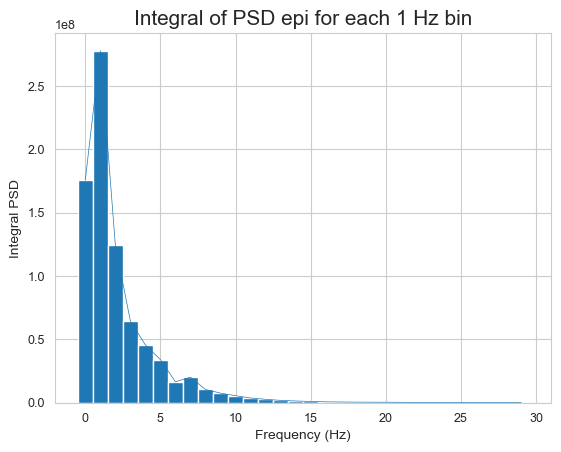

...

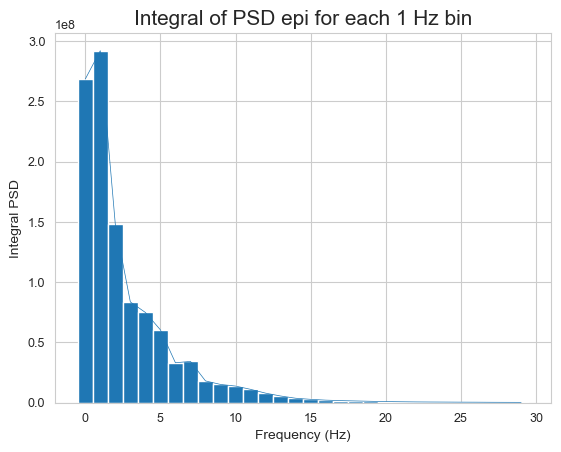

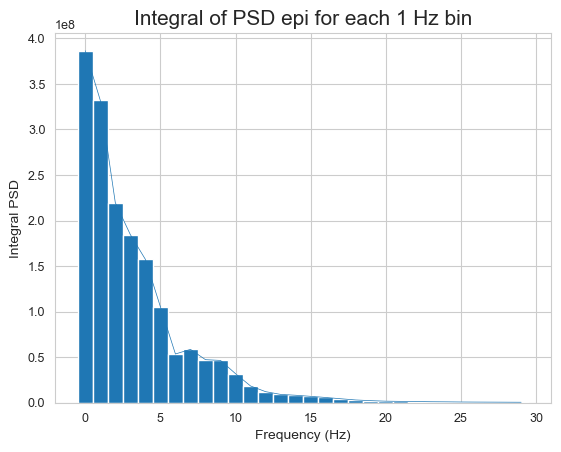

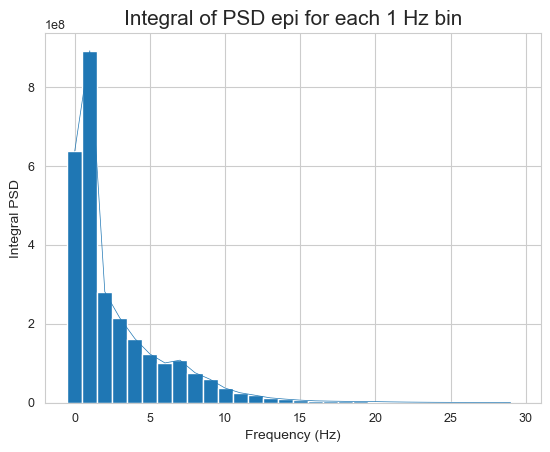

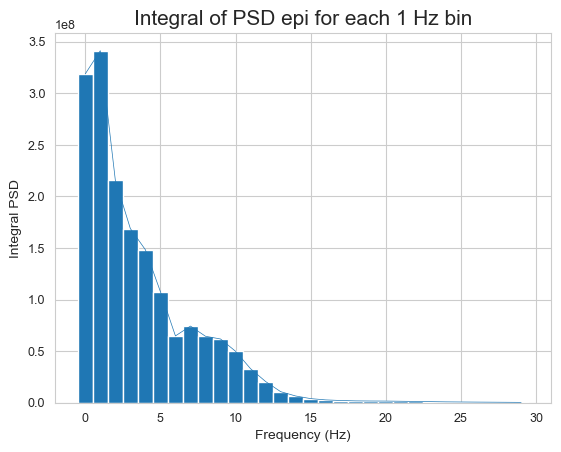

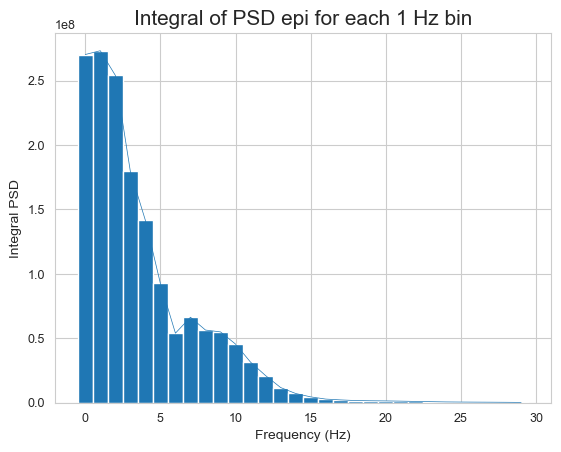

In [10]:
for filename in filenames_epi:
    file_path = os.path.join(folder_path_epi, filename)
    
    # Controlla se il file è vuoto
    if os.path.getsize(file_path) == 0:
        print(f"Il file {filename} è vuoto")
        continue

    # Leggi il file CSV
    df = pd.read_csv(file_path)

    # Crea una lista per memorizzare i risultati dell'integrazione
    integrale = []

    # Definisci il bin di frequenza
    bin_freq = 1

    # Calcola l'integrale della PSD per ogni intervallo di 1 Hz
    for i in range(0, int(df['Frequenza'].max()), bin_freq):
        # Seleziona la PSD nell'intervallo corrente
        psd_intervallo = df[(df['Frequenza'] >= i) & (df['Frequenza'] < i + bin_freq)]['PSD']

        # Calcola l'integrale della PSD nell'intervallo corrente
        integrale.append(np.trapz(psd_intervallo))


    # Calcola gli intervalli di frequenza
    intervalli_freq = range(0, int(df['Frequenza'].max()), bin_freq)

    # Crea un DataFrame con gli intervalli di frequenza e i corrispondenti integrali
    data = pd.DataFrame({
        'Frequenza': intervalli_freq,
        'Integrale_PSD': integrale,
        'Gruppo': filename  # Aggiungi un'etichetta per il gruppo
    })
    # Filtra i dati per mostrare solo gli integrali superiori a zero
    data_filtrata = data[data['Frequenza'] < 30]
    
    # Aggiungi i dati filtrati al DataFrame principale
    all_data = pd.concat([all_data, data_filtrata])
    
    # Crea un grafico a barre con i dati filtrati
    plt.plot(data_filtrata['Frequenza'], data_filtrata['Integrale_PSD'], label=filename)

    # Crea un grafico a barre con i dati filtrati
    plt.bar(data_filtrata['Frequenza'], data_filtrata['Integrale_PSD'], width=1)

    # Imposta le etichette degli assi
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Integral PSD')

    # Imposta il titolo del grafico
    plt.title('Integral of PSD epi for each 1 Hz bin')

    # Mostra il grafico
    plt.show()


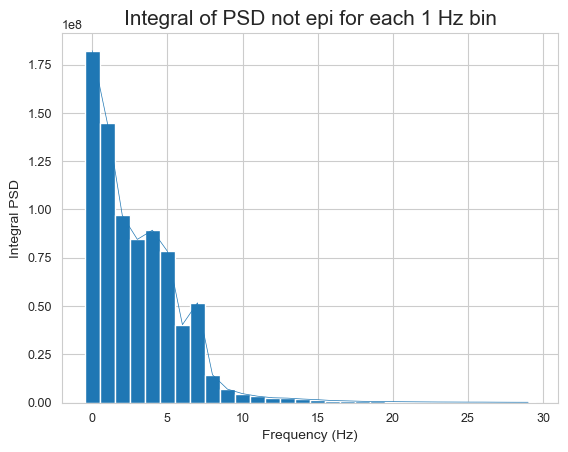

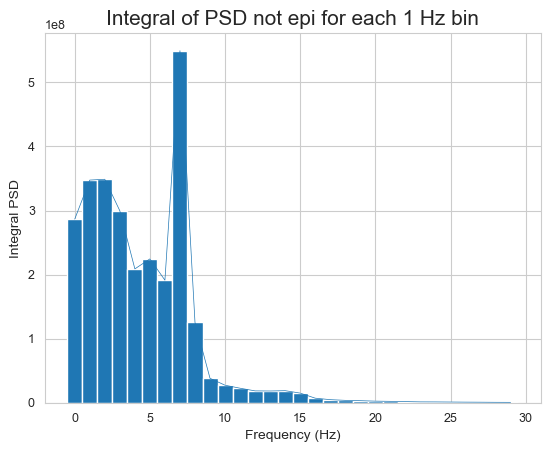

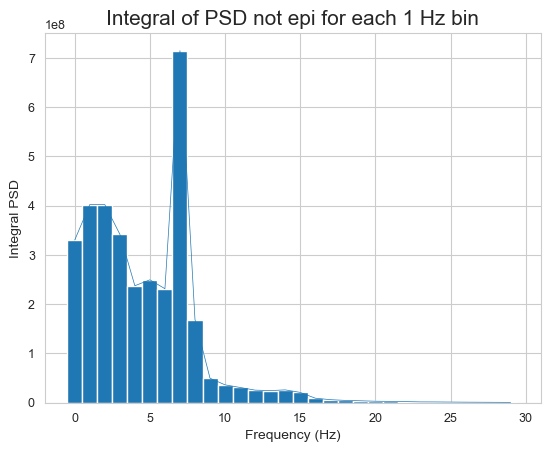

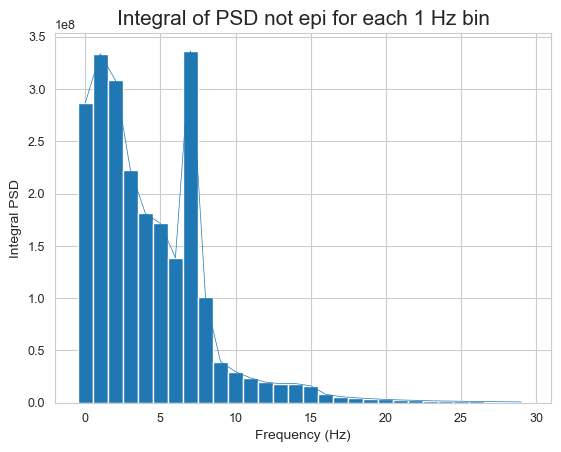

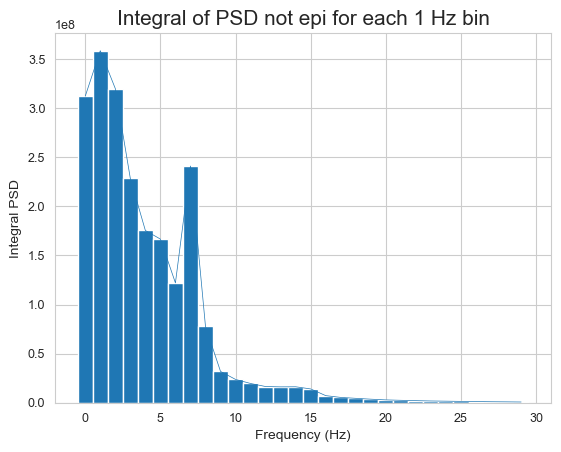

...

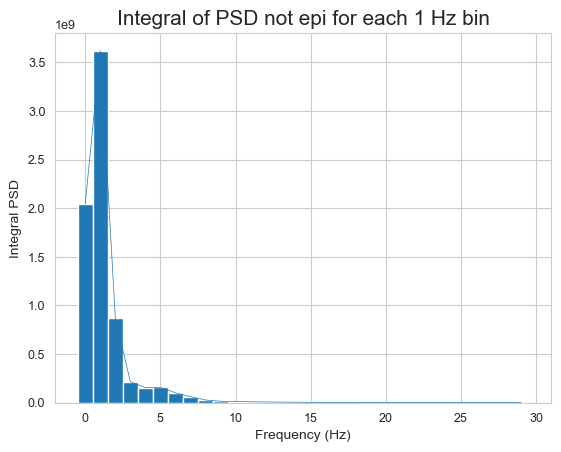

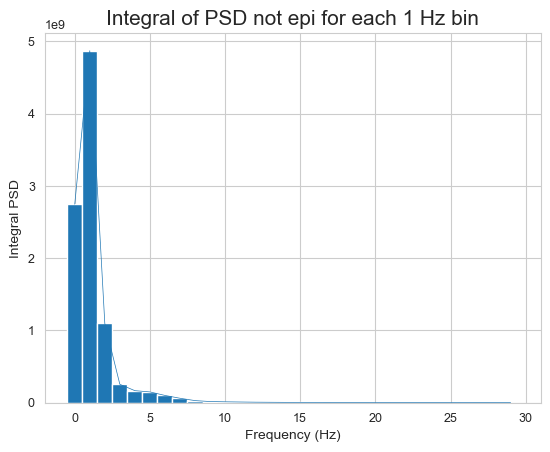

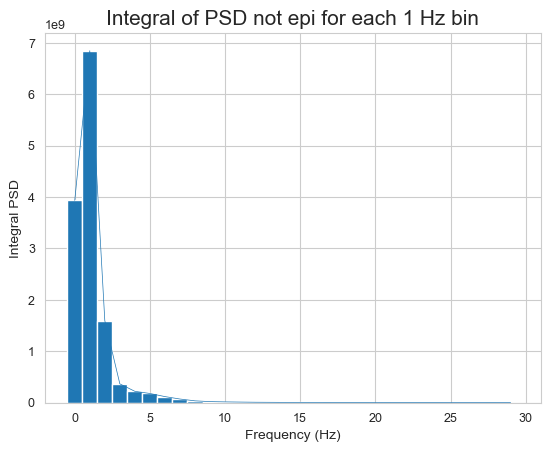

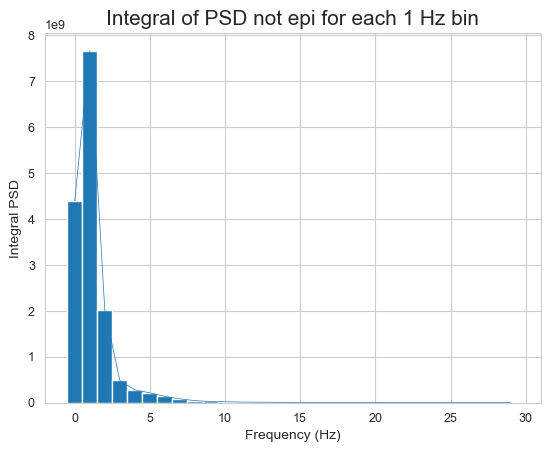

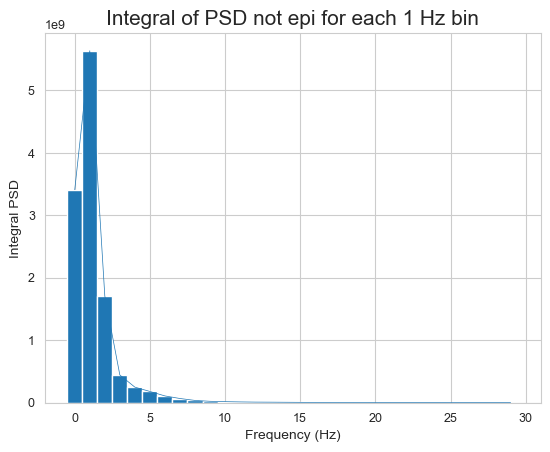

In [11]:
for filename in filenames_non:
    file_path = os.path.join(folder_path_non_epi, filename)
    
    # Controlla se il file è vuoto
    if os.path.getsize(file_path) == 0:
        print(f"Il file {filename} è vuoto")
        continue

    # Leggi il file CSV
    df = pd.read_csv(file_path)

    # Crea una lista per memorizzare i risultati dell'integrazione
    integrale = []

    # Definisci il bin di frequenza
    bin_freq = 1

    # Calcola l'integrale della PSD per ogni intervallo di 1 Hz
    for i in range(0, int(df['Frequenza'].max()), bin_freq):
        # Seleziona la PSD nell'intervallo corrente
        psd_intervallo = df[(df['Frequenza'] >= i) & (df['Frequenza'] < i + bin_freq)]['PSD']

        # Calcola l'integrale della PSD nell'intervallo corrente
        integrale.append(np.trapz(psd_intervallo))


    # Calcola gli intervalli di frequenza
    intervalli_freq = range(0, int(df['Frequenza'].max()), bin_freq)

    # Crea un DataFrame con gli intervalli di frequenza e i corrispondenti integrali
    data = pd.DataFrame({
        'Frequenza': intervalli_freq,
        'Integrale_PSD': integrale,
        'Gruppo': filename  # Aggiungi un'etichetta per il gruppo
    })
    # Filtra i dati per mostrare solo gli integrali superiori a zero
    data_filtrata = data[data['Frequenza'] < 30]
    
    # Aggiungi i dati filtrati al DataFrame principale
    all_data = pd.concat([all_data, data_filtrata])
    
    # Crea un grafico a barre con i dati filtrati
    plt.plot(data_filtrata['Frequenza'], data_filtrata['Integrale_PSD'], label=filename)

    # Crea un grafico a barre con i dati filtrati
    plt.bar(data_filtrata['Frequenza'], data_filtrata['Integrale_PSD'], width=1)

    # Imposta le etichette degli assi
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Integral PSD')

    # Imposta il titolo del grafico
    plt.title('Integral of PSD not epi for each 1 Hz bin')

    # Mostra il grafico
    plt.show()


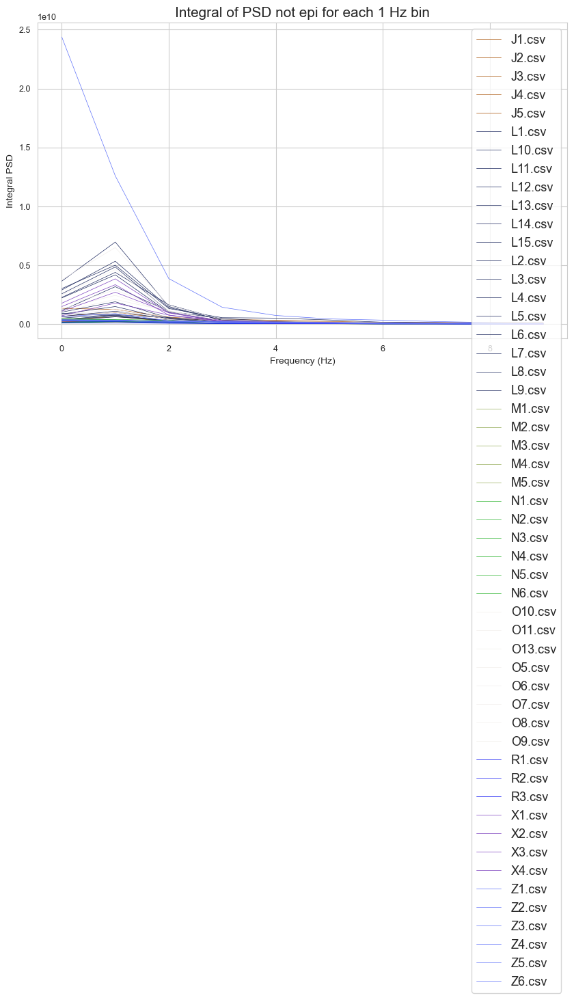

In [14]:
plt.figure(figsize=(10, 6))  # Imposta la dimensione del grafico
# Crea un dizionario di colori
colori = {}

for filename in filenames_epi:
    file_path = os.path.join(folder_path_epi, filename)
    
    # Controlla se il file è vuoto
    if os.path.getsize(file_path) == 0:
        print(f"Il file {filename} è vuoto")
        continue

    # Leggi il file CSV
    df = pd.read_csv(file_path)

    # Crea una lista per memorizzare i risultati dell'integrazione
    integrale = []

    # Definisci il bin di frequenza
    bin_freq = 1

    # Calcola l'integrale della PSD per ogni intervallo di 1 Hz
    for i in range(0, int(df['Frequenza'].max()), bin_freq):
        # Seleziona la PSD nell'intervallo corrente
        psd_intervallo = df[(df['Frequenza'] >= i) & (df['Frequenza'] < i + bin_freq)]['PSD']

        # Calcola l'integrale della PSD nell'intervallo corrente
        integrale.append(np.trapz(psd_intervallo))
    
    # Calcola gli intervalli di frequenza
    intervalli_freq = range(0, int(df['Frequenza'].max()), bin_freq)

    # Crea un DataFrame con gli intervalli di frequenza e i corrispondenti integrali
    data = pd.DataFrame({
        'Frequenza': intervalli_freq,
        'Integrale_PSD': integrale
    })

    # Filtra i dati per mostrare solo gli integrali superiori a zero
    data_filtrata = data[data['Frequenza'] < 10]
    # Se la lettera non è ancora nel dizionario dei colori, genera un colore casuale
    if filename[0] not in colori:
        colori[filename[0]] = "#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)])

    # Crea un grafico a barre con i dati filtrati
    plt.plot(data_filtrata['Frequenza'], data_filtrata['Integrale_PSD'], label=filename,color=colori[filename[0]])

# Imposta le etichette degli assi
plt.xlabel('Frequency (Hz)')
plt.ylabel('Integral PSD')

# Imposta il titolo del grafico
plt.title('Integral of PSD epi for each 1 Hz bin')

# Aggiungi una legenda
plt.legend()

# Mostra il grafico
plt.show()


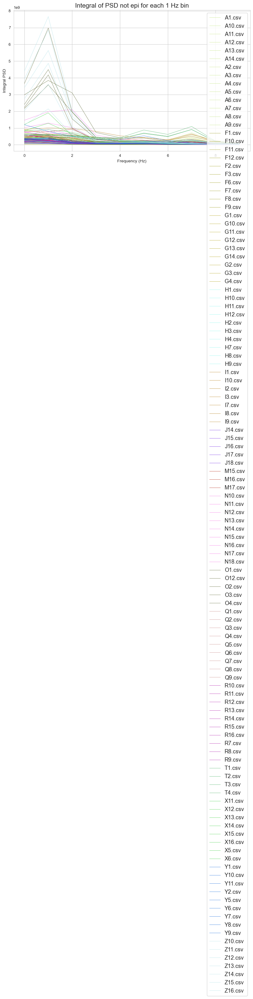

In [15]:
plt.figure(figsize=(10, 6))  # Imposta la dimensione del grafico

# Crea un dizionario di colori
colori = {}

for filename in filenames_non:
    file_path = os.path.join(folder_path_non_epi, filename)
    
    # Controlla se il file è vuoto
    if os.path.getsize(file_path) == 0:
        print(f"Il file {filename} è vuoto")
        continue

    # Leggi il file CSV
    df = pd.read_csv(file_path)

    # Crea una lista per memorizzare i risultati dell'integrazione
    integrale = []

    # Definisci il bin di frequenza
    bin_freq = 1

    # Calcola l'integrale della PSD per ogni intervallo di 1 Hz
    for i in range(0, int(df['Frequenza'].max()), bin_freq):
        # Seleziona la PSD nell'intervallo corrente
        psd_intervallo = df[(df['Frequenza'] >= i) & (df['Frequenza'] < i + bin_freq)]['PSD']

        # Calcola l'integrale della PSD nell'intervallo corrente
        integrale.append(np.trapz(psd_intervallo))
    
    # Calcola gli intervalli di frequenza
    intervalli_freq = range(0, int(df['Frequenza'].max()), bin_freq)

    # Crea un DataFrame con gli intervalli di frequenza e i corrispondenti integrali
    data = pd.DataFrame({
        'Frequenza': intervalli_freq,
        'Integrale_PSD': integrale
    })

    # Filtra i dati per mostrare solo gli integrali superiori a zero
    data_filtrata = data[data['Frequenza'] < 30]
    # Se la lettera non è ancora nel dizionario dei colori, genera un colore casuale
    if filename[0] not in colori:
        colori[filename[0]] = "#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)])

    # Crea un grafico a barre con i dati filtrati
    plt.plot(data_filtrata['Frequenza'], data_filtrata['Integrale_PSD'], label=filename,color=colori[filename[0]])

# Imposta le etichette degli assi
plt.xlabel('Frequency (Hz)')
plt.ylabel('Integral PSD')

# Imposta il titolo del grafico
plt.title('Integral of PSD not epi for each 1 Hz bin')

# Aggiungi una legenda
plt.legend()

# Mostra il grafico
plt.show()


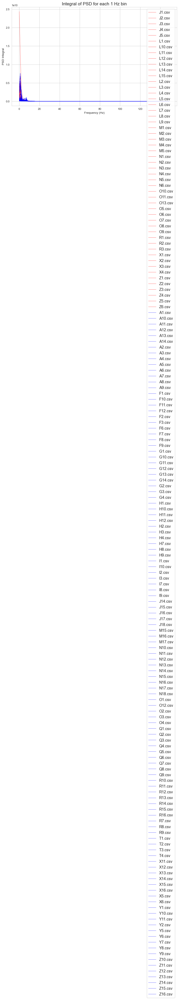

Il segnale con l'integrale più alto è: Z1.csv


In [62]:
# Definisci i percorsi delle cartelle
folder_paths = ['psd_epi', 'psd_non_epi']

# Crea un dizionario di colori per i gruppi
colori_gruppi = {'psd_epi': 'red', 'psd_non_epi': 'blue'}

plt.figure(figsize=(10, 6))  # Imposta la dimensione del grafico
max_integrale = -np.inf
max_filename = ""
# Itera su entrambe le cartelle
for folder_path in folder_paths:
    # Leggi tutti i file nella cartella
    filenames = sorted([f for f in os.listdir(folder_path) if f.endswith('.csv')], key=lambda x: int(x.split('_')[0]) if x.split('_')[0].isdigit() else float('inf'))

    # Ottieni il colore per il gruppo corrente
    colore_gruppo = colori_gruppi[folder_path]

    # Itera su tutti i file
    for filename in filenames:
        file_path = os.path.join(folder_path, filename)

        # Controlla se il file è vuoto
        if os.path.getsize(file_path) == 0:
            print(f"Il file {filename} è vuoto")
            continue

        # Leggi il file CSV
        df = pd.read_csv(file_path)

        # Crea una lista per memorizzare i risultati dell'integrazione
        integrale = []

        # Definisci il bin di frequenza
        bin_freq = 1

        # Calcola l'integrale della PSD per ogni intervallo di 1 Hz
        for i in range(0, int(df['Frequenza'].max()), bin_freq):
            # Seleziona la PSD nell'intervallo corrente
            psd_intervallo = df[(df['Frequenza'] >= i) & (df['Frequenza'] < i + bin_freq)]['PSD']

            # Calcola l'integrale della PSD nell'intervallo corrente
            integrale.append(np.trapz(psd_intervallo))

        # Calcola gli intervalli di frequenza
        intervalli_freq = range(0, int(df['Frequenza'].max()), bin_freq)

        # Crea un DataFrame con gli intervalli di frequenza e i corrispondenti integrali
        data = pd.DataFrame({
            'Frequenza': intervalli_freq,
            'Integrale_PSD': integrale
        })

        # Filtra i dati per mostrare solo gli integrali superiori a zero
        data_filtrata = data[(data['Frequenza'] <30)]
     # Trova il valore massimo dell'integrale e aggiorna il massimo globale se necessario
        max_integrale_corrente = max(data_filtrata['Integrale_PSD'])
        if max_integrale_corrente > max_integrale:
            max_integrale = max_integrale_corrente
            max_filename = filename

        # Crea un grafico a barre con i dati filtrati
        plt.plot(data_filtrata['Frequenza'], data_filtrata['Integrale_PSD'], label=filename, color=colore_gruppo)

# Imposta le etichette degli assi
plt.xlabel('Frequency (Hz)')
plt.ylabel('PSD Integral')

# Imposta il titolo del grafico
plt.title('Integral of PSD for each 1 Hz bin')

# Aggiungi una legenda
plt.legend()

#plt.ylim(0,1.0)
# Mostra il grafico
plt.show()

# Stampa il nome del file con l'integrale più alto
print(f"Il segnale con l'integrale più alto è: {max_filename}")


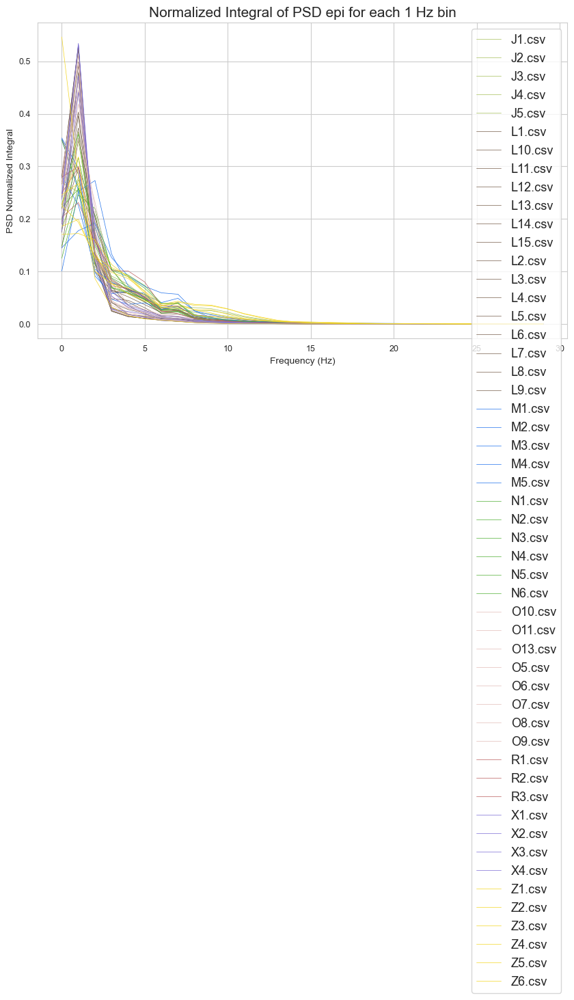

In [19]:
# Crea un dizionario di colori
colori = {}

plt.figure(figsize=(10, 6))  # Imposta la dimensione del grafico

for filename in filenames_epi:
    file_path = os.path.join(folder_path_epi, filename)
    
    # Controlla se il file è vuoto
    if os.path.getsize(file_path) == 0:
        print(f"Il file {filename} è vuoto")
        continue

    # Se la lettera non è ancora nel dizionario dei colori, genera un colore casuale
    if filename[0] not in colori:
        colori[filename[0]] = "#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)])

    # Leggi il file CSV
    df = pd.read_csv(file_path)

    # Crea una lista per memorizzare i risultati dell'integrazione
    integrale = []

    # Definisci il bin di frequenza
    bin_freq = 1

    # Calcola l'integrale della PSD per ogni intervallo di 1 Hz
    for i in range(0, int(df['Frequenza'].max()), bin_freq):
        # Seleziona la PSD nell'intervallo corrente
        psd_intervallo = df[(df['Frequenza'] >= i) & (df['Frequenza'] < i + bin_freq)]['PSD']

        # Calcola l'integrale della PSD nell'intervallo corrente
        integrale.append(np.trapz(psd_intervallo))

    # Calcola gli intervalli di frequenza
    intervalli_freq = range(0, int(df['Frequenza'].max()), bin_freq)

    # Crea un DataFrame con gli intervalli di frequenza e i corrispondenti integrali
    data = pd.DataFrame({
        'Frequenza': intervalli_freq,
        'Integrale_PSD': integrale
    })

    # Normalizza l'integrale
    data['Integrale_PSD'] = data['Integrale_PSD'] / data['Integrale_PSD'].sum()
    
   
    # Filtra i dati per mostrare solo gli integrali superiori a zero

    data_filtrata1=data[data['Frequenza']<30]

    # Crea un grafico a barre con i dati filtrati
    #plt.plot(data_filtrata['Frequenza'], data_filtrata['Integrale_PSD'], label=filename, color=colori[filename[0]])
    
    plt.plot(data_filtrata1['Frequenza'], data_filtrata1['Integrale_PSD'], label=filename, color=colori[filename[0]])


# Imposta le etichette degli assi
plt.xlabel('Frequency (Hz)')
plt.ylabel('PSD Normalized Integral')

# Imposta il titolo del grafico
plt.title('Normalized Integral of PSD epi for each 1 Hz bin')

# Aggiungi una legenda
plt.legend()
# Mostra il grafico
plt.show()


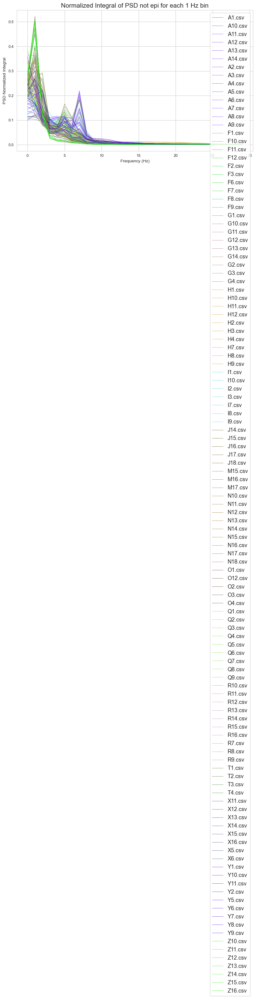

In [20]:
# Crea un dizionario di colori
colori = {}

plt.figure(figsize=(10, 6))  # Imposta la dimensione del grafico

for filename in filenames_non:
    file_path = os.path.join(folder_path_non_epi, filename)
    
    # Controlla se il file è vuoto
    if os.path.getsize(file_path) == 0:
        print(f"Il file {filename} è vuoto")
        continue

    # Se la lettera non è ancora nel dizionario dei colori, genera un colore casuale
    if filename[0] not in colori:
        colori[filename[0]] = "#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)])

    # Leggi il file CSV
    df = pd.read_csv(file_path)

    # Crea una lista per memorizzare i risultati dell'integrazione
    integrale = []

    # Definisci il bin di frequenza
    bin_freq = 1

    # Calcola l'integrale della PSD per ogni intervallo di 1 Hz
    for i in range(0, int(df['Frequenza'].max()), bin_freq):
        # Seleziona la PSD nell'intervallo corrente
        psd_intervallo = df[(df['Frequenza'] >= i) & (df['Frequenza'] < i + bin_freq)]['PSD']

        # Calcola l'integrale della PSD nell'intervallo corrente
        integrale.append(np.trapz(psd_intervallo))

    # Calcola gli intervalli di frequenza
    intervalli_freq = range(0, int(df['Frequenza'].max()), bin_freq)

    # Crea un DataFrame con gli intervalli di frequenza e i corrispondenti integrali
    data = pd.DataFrame({
        'Frequenza': intervalli_freq,
        'Integrale_PSD': integrale
    })

    # Normalizza l'integrale
    data['Integrale_PSD'] = data['Integrale_PSD'] / data['Integrale_PSD'].sum()
    
   
    # Filtra i dati per mostrare solo gli integrali superiori a zero

    data_filtrata1=data[data['Frequenza']<30]

    # Crea un grafico a barre con i dati filtrati
    #plt.plot(data_filtrata['Frequenza'], data_filtrata['Integrale_PSD'], label=filename, color=colori[filename[0]])
    
    plt.plot(data_filtrata1['Frequenza'], data_filtrata1['Integrale_PSD'], label=filename, color=colori[filename[0]])


# Imposta le etichette degli assi
plt.xlabel('Frequency (Hz)')
plt.ylabel('PSD Normalized Integral')

# Imposta il titolo del grafico
plt.title('Normalized Integral of PSD not epi for each 1 Hz bin')

# Aggiungi una legenda
plt.legend()
# Mostra il grafico
plt.show()


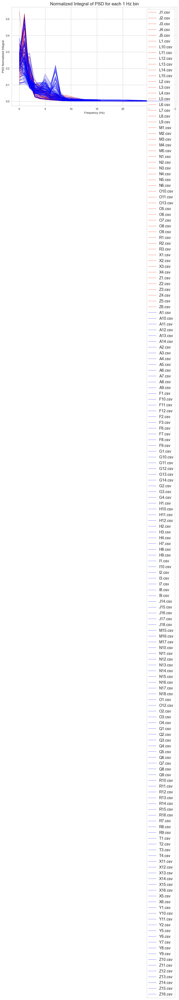

Il segnale con l'integrale più alto è: Z1.csv


In [28]:
# Definisci i percorsi delle cartelle
folder_paths = ['psd_epi', 'psd_non_epi']

# Crea un dizionario di colori per i gruppi
colori_gruppi = {'psd_epi': 'red', 'psd_non_epi': 'blue'}

plt.figure(figsize=(10, 6))  # Imposta la dimensione del grafico
max_integrale = -np.inf
max_filename = ""
# Itera su entrambe le cartelle
for folder_path in folder_paths:
    # Leggi tutti i file nella cartella
    filenames = sorted([f for f in os.listdir(folder_path) if f.endswith('.csv')], key=lambda x: int(x.split('_')[0]) if x.split('_')[0].isdigit() else float('inf'))

    # Ottieni il colore per il gruppo corrente
    colore_gruppo = colori_gruppi[folder_path]

    # Itera su tutti i file
    for filename in filenames:
        file_path = os.path.join(folder_path, filename)

        # Controlla se il file è vuoto
        if os.path.getsize(file_path) == 0:
            print(f"Il file {filename} è vuoto")
            continue

        # Leggi il file CSV
        df = pd.read_csv(file_path)

        # Crea una lista per memorizzare i risultati dell'integrazione
        integrale = []

        # Definisci il bin di frequenza
        bin_freq = 1

        # Calcola l'integrale della PSD per ogni intervallo di 1 Hz
        for i in range(0, int(df['Frequenza'].max()), bin_freq):
            # Seleziona la PSD nell'intervallo corrente
            psd_intervallo = df[(df['Frequenza'] >= i) & (df['Frequenza'] < i + bin_freq)]['PSD']

            # Calcola l'integrale della PSD nell'intervallo corrente
            integrale.append(np.trapz(psd_intervallo))

        # Calcola gli intervalli di frequenza
        intervalli_freq = range(0, int(df['Frequenza'].max()), bin_freq)

        # Crea un DataFrame con gli intervalli di frequenza e i corrispondenti integrali
        data = pd.DataFrame({
            'Frequenza': intervalli_freq,
            'Integrale_PSD': integrale
        })

        # Normalizza l'integrale
        data['Integrale_PSD'] = data['Integrale_PSD'] / data['Integrale_PSD'].sum()

        # Filtra i dati per mostrare solo gli integrali superiori a zero
        data_filtrata = data[data['Frequenza'] <30]

        # Trova il valore massimo dell'integrale e aggiorna il massimo globale se necessario
        max_integrale_corrente = max(data_filtrata['Integrale_PSD'])
        if max_integrale_corrente > max_integrale:
            max_integrale = max_integrale_corrente
            max_filename = filename

        # Crea un grafico a barre con i dati filtrati
        plt.plot(data_filtrata['Frequenza'], data_filtrata['Integrale_PSD'], label=filename, color=colore_gruppo)

# Imposta le etichette degli assi
plt.xlabel('Frequency (Hz)')
plt.ylabel('PSD Normalized Integral')

# Imposta il titolo del grafico
plt.title('Normalized Integral of PSD for each 1 Hz bin')

# Aggiungi una legenda
plt.legend()

# Mostra il grafico
plt.show()

# Stampa il nome del file con l'integrale più alto
print(f"Il segnale con l'integrale più alto è: {max_filename}")


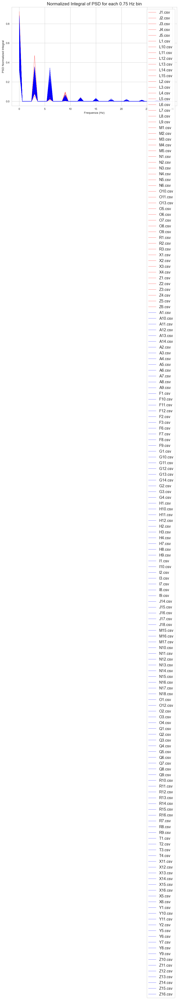

Il segnale con l'integrale più alto è: Z1.csv


In [35]:
# Definisci i percorsi delle cartelle
folder_paths = ['psd_epi', 'psd_non_epi']

# Crea un dizionario di colori per i gruppi
colori_gruppi = {'psd_epi': 'red', 'psd_non_epi': 'blue'}

plt.figure(figsize=(10, 6))  # Imposta la dimensione del grafico
max_integrale = -np.inf
max_filename = ""

# Itera su entrambe le cartelle
for folder_path in folder_paths:
    # Leggi tutti i file nella cartella
    filenames = sorted([f for f in os.listdir(folder_path) if f.endswith('.csv')], key=lambda x: int(x.split('_')[0]) if x.split('_')[0].isdigit() else float('inf'))

    # Ottieni il colore per il gruppo corrente
    colore_gruppo = colori_gruppi[folder_path]

    # Itera su tutti i file
    for filename in filenames:
        file_path = os.path.join(folder_path, filename)

        # Controlla se il file è vuoto
        if os.path.getsize(file_path) == 0:
            print(f"Il file {filename} è vuoto")
            continue

        # Leggi il file CSV
        df = pd.read_csv(file_path)

        # Crea una lista per memorizzare i risultati dell'integrazione
        integrale = []

        # Definisci il bin di frequenza
        bin_freq = 0.6

        # Calcola l'integrale della PSD per ogni intervallo di 0.75 Hz
        for i in np.arange(0, df['Frequenza'].max(), bin_freq):
            # Seleziona la PSD e le frequenze nell'intervallo corrente
            psd_intervallo = df[(df['Frequenza'] >= i) & (df['Frequenza'] < i + bin_freq)]['PSD']
            freq_intervallo = df[(df['Frequenza'] >= i) & (df['Frequenza'] < i + bin_freq)]['Frequenza']

            # Calcola l'integrale della PSD nell'intervallo corrente usando il metodo trapezoidale
            if len(psd_intervallo) > 1:
                integrale.append(np.trapz(psd_intervallo.values, x=freq_intervallo.values))
            else:
                integrale.append(0)

        # Calcola gli intervalli di frequenza
        intervalli_freq = np.arange(0, df['Frequenza'].max(), bin_freq)

        # Crea un DataFrame con gli intervalli di frequenza e i corrispondenti integrali
        data = pd.DataFrame({
            'Frequenza': intervalli_freq,
            'Integrale_PSD': integrale
        })

        # Normalizza l'integrale
        data['Integrale_PSD'] = data['Integrale_PSD'] / data['Integrale_PSD'].sum()

        # Filtra i dati per mostrare solo gli integrali superiori a zero
        data_filtrata = data[data['Frequenza'] < 30]

        # Trova il valore massimo dell'integrale e aggiorna il massimo globale se necessario
        max_integrale_corrente = max(data_filtrata['Integrale_PSD'])
        if max_integrale_corrente > max_integrale:
            max_integrale = max_integrale_corrente
            max_filename = filename

        # Crea un grafico a barre con i dati filtrati
        plt.plot(data_filtrata['Frequenza'], data_filtrata['Integrale_PSD'], label=filename, color=colore_gruppo)

# Imposta le etichette degli assi
plt.xlabel('Frequenza (Hz)')
plt.ylabel('PSD Normalized Integral')

# Imposta il titolo del grafico
plt.title('Normalized Integral of PSD for each 0.75 Hz bin')

# Aggiungi una legenda
plt.legend()

# Mostra il grafico
plt.show()

# Stampa il nome del file con l'integrale più alto
print(f"Il segnale con l'integrale più alto è: {max_filename}")


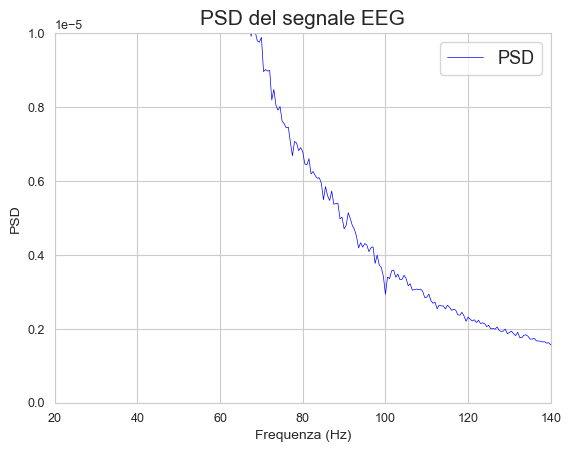

In [7]:
import matplotlib.pyplot as plt
import pandas as pd
import os

# Percorso del file
file_path = 'normalized_psd_epi/L1.csv'

# Controlla se il file è vuoto
if os.path.getsize(file_path) == 0:
    print(f"Il file {file_path} è vuoto")
else:
    # Leggi il file CSV
    df = pd.read_csv(file_path)

    # Filtra i dati per mostrare solo le frequenze inferiori a 30 Hz
    data_filtrata = df[df['Frequenza'] < 150]

    # Crea un grafico con i dati filtrati
    plt.plot(data_filtrata['Frequenza'], data_filtrata['PSD'], label='PSD', color='blue')

    # Imposta le etichette degli assi
    plt.xlabel('Frequenza (Hz)')
    plt.ylabel('PSD')
    plt.xlim(20,140)
    plt.ylim(0,10**(-5))
    # Imposta il titolo del grafico
    plt.title('PSD del segnale EEG')

    # Aggiungi una legenda
    plt.legend()

    # Mostra il grafico
    plt.show()


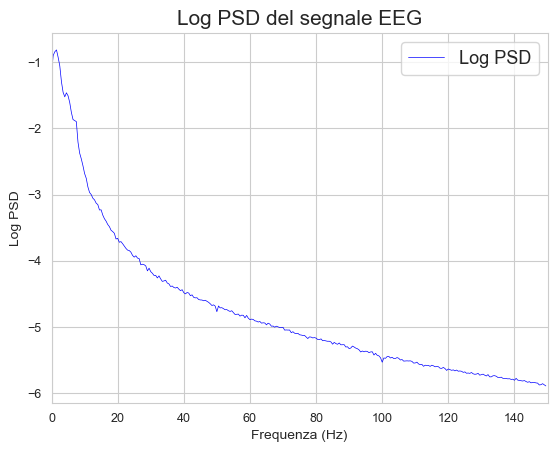

In [75]:
import matplotlib.pyplot as plt
import pandas as pd
import os
import numpy as np

# Percorso del file
file_path = 'normalized_psd_epi/L1.csv'

# Controlla se il file è vuoto
if os.path.getsize(file_path) == 0:
    print(f"Il file {file_path} è vuoto")
else:
    # Leggi il file CSV
    df = pd.read_csv(file_path)

    # Filtra i dati per mostrare solo le frequenze inferiori a 30 Hz
    data_filtrata = df[df['Frequenza'] < 150].copy()

    # Applica il logaritmo ai valori di PSD
    data_filtrata.loc[:, 'Log_PSD'] = np.log10(data_filtrata['PSD'])

    # Crea un grafico con i dati filtrati
    plt.plot(data_filtrata['Frequenza'], data_filtrata['Log_PSD'], label='Log PSD', color='blue')

    # Imposta le etichette degli assi
    plt.xlabel('Frequenza (Hz)')
    plt.ylabel('Log PSD')
    plt.xlim(0,150)
    #plt.ylim(-7, 0)
    # Imposta il titolo del grafico
    plt.title('Log PSD del segnale EEG')

    # Aggiungi una legenda
    plt.legend()

    # Mostra il grafico
    plt.show()


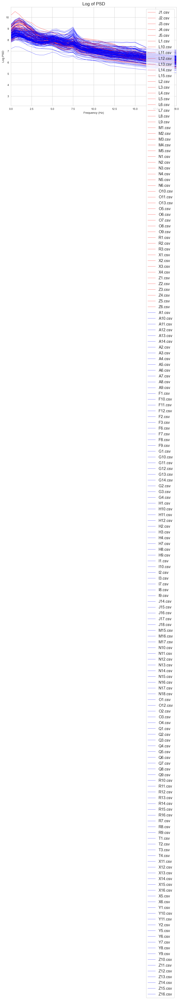

In [10]:
# Definisci i percorsi delle cartelle
folder_paths = ['psd_epi', 'psd_non_epi']

# Crea un dizionario di colori per i gruppi
colori_gruppi = {'psd_epi': 'red', 'psd_non_epi': 'blue'}

plt.figure(figsize=(10, 6))  # Imposta la dimensione del grafico

# Itera su entrambe le cartelle
for folder_path in folder_paths:
    # Leggi tutti i file nella cartella
    filenames = sorted([f for f in os.listdir(folder_path) if f.endswith('.csv')], key=lambda x: int(x.split('_')[0]) if x.split('_')[0].isdigit() else float('inf'))

    # Ottieni il colore per il gruppo corrente
    colore_gruppo = colori_gruppi[folder_path]

    # Itera su tutti i file
    for filename in filenames:
        file_path = os.path.join(folder_path, filename)

        # Controlla se il file è vuoto
        if os.path.getsize(file_path) == 0:
            print(f"Il file {filename} è vuoto")
            continue

        # Leggi il file CSV
        df = pd.read_csv(file_path)

        # Filtra i dati per mostrare solo gli integrali superiori a zero
        data_filtrata = df[df['Frequenza'] <150].copy()
        # Applica il logaritmo ai valori di PSD
        data_filtrata.loc[:, 'Log_PSD'] = np.log10(data_filtrata['PSD'])

        # Crea un grafico a barre con i dati filtrati
        plt.plot(data_filtrata['Frequenza'], data_filtrata['Log_PSD'], label=filename, color=colore_gruppo)

# Imposta le etichette degli assi
plt.xlabel('Frequency (Hz)')
plt.ylabel('Log PSD')
plt.xlim(0,20)
# Imposta il titolo del grafico
plt.title('Log of PSD')

# Aggiungi una legenda
plt.legend()

# Mostra il grafico
plt.show()

# Stampa il nome del file con l'integrale più alto
#print(f"Il segnale con l'integrale più alto è: {max_filename}")


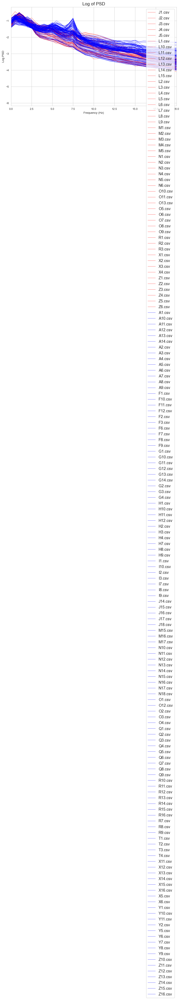

In [13]:
# Definisci i percorsi delle cartelle
folder_paths = ['normalized_psd_epi', 'normalized_psd_non_epi']

# Crea un dizionario di colori per i gruppi
colori_gruppi = {'normalized_psd_epi': 'red', 'normalized_psd_non_epi': 'blue'}

plt.figure(figsize=(10, 6))  # Imposta la dimensione del grafico

# Itera su entrambe le cartelle
for folder_path in folder_paths:
    # Leggi tutti i file nella cartella
    filenames = sorted([f for f in os.listdir(folder_path) if f.endswith('.csv')], key=lambda x: int(x.split('_')[0]) if x.split('_')[0].isdigit() else float('inf'))

    # Ottieni il colore per il gruppo corrente
    colore_gruppo = colori_gruppi[folder_path]

    # Itera su tutti i file
    for filename in filenames:
        file_path = os.path.join(folder_path, filename)

        # Controlla se il file è vuoto
        if os.path.getsize(file_path) == 0:
            print(f"Il file {filename} è vuoto")
            continue

        # Leggi il file CSV
        df = pd.read_csv(file_path)

        # Filtra i dati per mostrare solo gli integrali superiori a zero
        data_filtrata = df[df['Frequenza'] <150].copy()
        # Applica il logaritmo ai valori di PSD
        data_filtrata.loc[:, 'Log_PSD'] = np.log10(data_filtrata['PSD'])

        # Crea un grafico a barre con i dati filtrati
        plt.plot(data_filtrata['Frequenza'], data_filtrata['Log_PSD'], label=filename, color=colore_gruppo)

# Imposta le etichette degli assi
plt.xlabel('Frequency (Hz)')
plt.ylabel('Log PSD')
plt.xlim(0,20)
# Imposta il titolo del grafico
plt.title('Log of PSD')

# Aggiungi una legenda
plt.legend()

# Mostra il grafico
plt.show()

# Stampa il nome del file con l'integrale più alto
#print(f"Il segnale con l'integrale più alto è: {max_filename}")


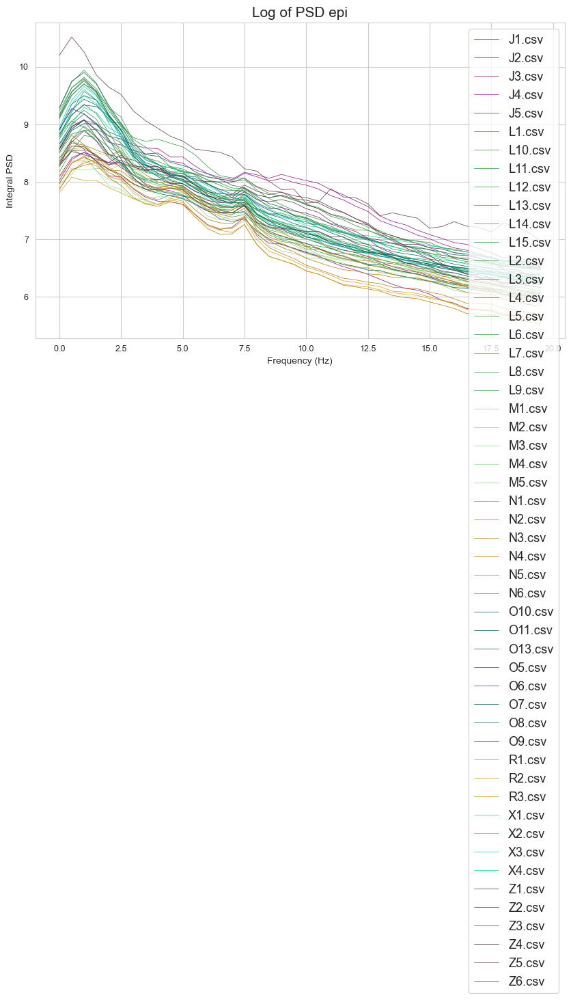

In [18]:
plt.figure(figsize=(10, 6))  # Imposta la dimensione del grafico
# Crea un dizionario di colori
colori = {}

for filename in filenames_epi:
    file_path = os.path.join(folder_path_epi, filename)
    
    # Controlla se il file è vuoto
    if os.path.getsize(file_path) == 0:
        print(f"Il file {filename} è vuoto")
        continue

    # Leggi il file CSV
    df = pd.read_csv(file_path)

    # Filtra i dati per mostrare solo gli integrali superiori a zero
    data_filtrata = df[df['Frequenza'] <20].copy()
    # Applica il logaritmo ai valori di PSD
    data_filtrata.loc[:, 'Log_PSD'] = np.log10(data_filtrata['PSD'])
    # Se la lettera non è ancora nel dizionario dei colori, genera un colore casuale
    if filename[0] not in colori:
        colori[filename[0]] = "#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)])

    # Crea un grafico a barre con i dati filtrati
    plt.plot(data_filtrata['Frequenza'], data_filtrata['Log_PSD'], label=filename,color=colori[filename[0]])

# Imposta le etichette degli assi
plt.xlabel('Frequency (Hz)')
plt.ylabel('Integral PSD')

# Imposta il titolo del grafico
plt.title('Log of PSD epi')

# Aggiungi una legenda
plt.legend()

# Mostra il grafico
plt.show()


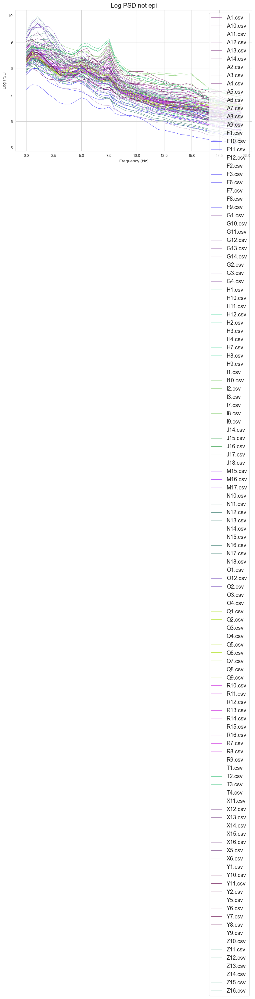

In [21]:
plt.figure(figsize=(10, 6))  # Imposta la dimensione del grafico
# Crea un dizionario di colori
colori = {}

for filename in filenames_non:
    file_path = os.path.join(folder_path_non_epi, filename)
    
    # Controlla se il file è vuoto
    if os.path.getsize(file_path) == 0:
        print(f"Il file {filename} è vuoto")
        continue

    # Leggi il file CSV
    df = pd.read_csv(file_path)

     # Filtra i dati per mostrare solo gli integrali superiori a zero
    data_filtrata = df[df['Frequenza'] <20].copy()
    # Applica il logaritmo ai valori di PSD
    data_filtrata.loc[:, 'Log_PSD'] = np.log10(data_filtrata['PSD'])
    # Se la lettera non è ancora nel dizionario dei colori, genera un colore casuale
    if filename[0] not in colori:
        colori[filename[0]] = "#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)])

    # Crea un grafico a barre con i dati filtrati
    plt.plot(data_filtrata['Frequenza'], data_filtrata['Log_PSD'], label=filename,color=colori[filename[0]])

# Imposta le etichette degli assi
plt.xlabel('Frequency (Hz)')
plt.ylabel('Log PSD')

# Imposta il titolo del grafico
plt.title('Log PSD not epi')

# Aggiungi una legenda
plt.legend()

# Mostra il grafico
plt.show()


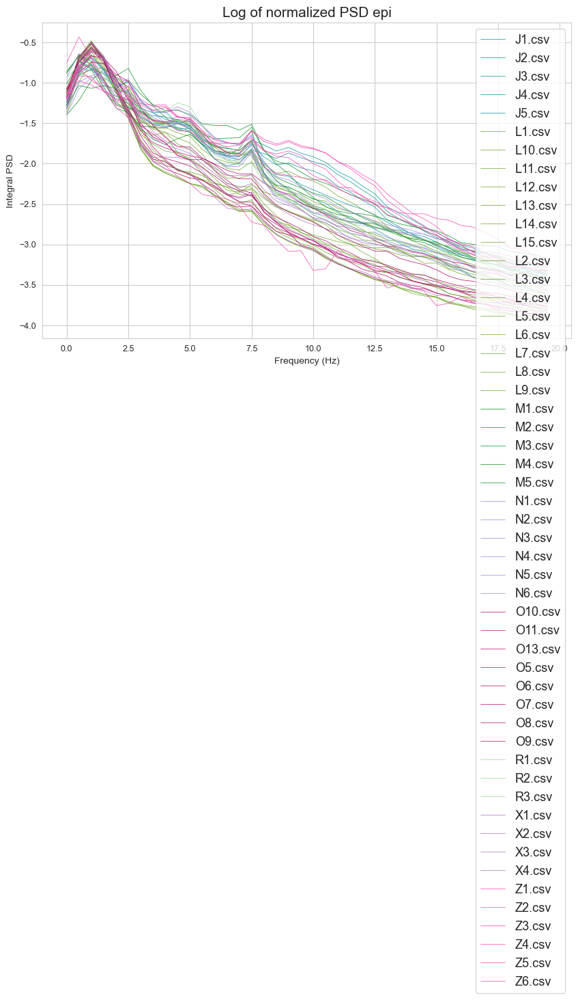

In [17]:
folder_path= 'normalized_psd_epi'
# Leggi tutti i file nella cartella
filenames_epi = sorted([f for f in os.listdir(folder_path) if f.endswith('.csv')], key=lambda x: int(x.split('_')[0]) if x.split('_')[0].isdigit() else float('inf'))

# Crea un DataFrame vuoto per memorizzare tutti i dati
all_data = pd.DataFrame()

plt.figure(figsize=(10, 6))  # Imposta la dimensione del grafico
# Crea un dizionario di colori
colori = {}

for filename in filenames_epi:
    file_path = os.path.join(folder_path, filename)
    
    # Controlla se il file è vuoto
    if os.path.getsize(file_path) == 0:
        print(f"Il file {filename} è vuoto")
        continue

    # Leggi il file CSV
    df = pd.read_csv(file_path)

     # Filtra i dati per mostrare solo i valori inferiori a 150
    data_filtrata = df[df['Frequenza'] <20].copy()
    # Applica il logaritmo ai valori di PSD
    data_filtrata.loc[:, 'Log_PSD'] = np.log10(data_filtrata['PSD'])
    # Se la lettera non è ancora nel dizionario dei colori, genera un colore casuale
    if filename[0] not in colori:
        colori[filename[0]] = "#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)])

    # Crea un grafico a barre con i dati filtrati
    plt.plot(data_filtrata['Frequenza'], data_filtrata['Log_PSD'], label=filename,color=colori[filename[0]])

# Imposta le etichette degli assi
plt.xlabel('Frequency (Hz)')
plt.ylabel('Integral PSD')

# Imposta il titolo del grafico
plt.title('Log of normalized PSD epi')

# Aggiungi una legenda
plt.legend()

# Mostra il grafico
plt.show()


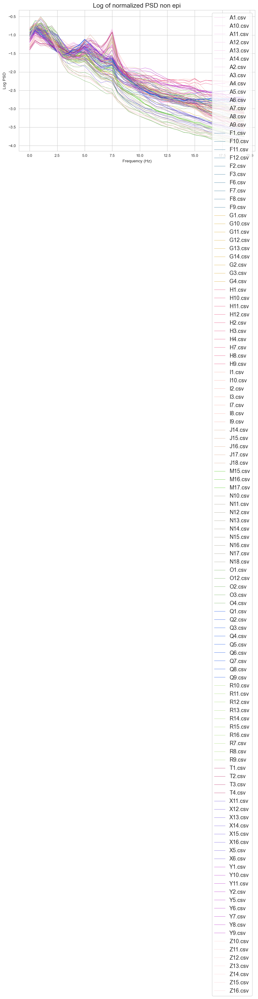

In [19]:
folder_path= 'normalized_psd_non_epi'
# Leggi tutti i file nella cartella
filenames_non_epi = sorted([f for f in os.listdir(folder_path) if f.endswith('.csv')], key=lambda x: int(x.split('_')[0]) if x.split('_')[0].isdigit() else float('inf'))

# Crea un DataFrame vuoto per memorizzare tutti i dati
all_data = pd.DataFrame()

plt.figure(figsize=(10, 6))  # Imposta la dimensione del grafico
# Crea un dizionario di colori
colori = {}

for filename in filenames_non_epi:
    file_path = os.path.join(folder_path, filename)
    
    # Controlla se il file è vuoto
    if os.path.getsize(file_path) == 0:
        print(f"Il file {filename} è vuoto")
        continue

    # Leggi il file CSV
    df = pd.read_csv(file_path)

     # Filtra i dati per mostrare solo i valori inferiori a 150
    data_filtrata = df[df['Frequenza'] <20].copy()
    # Applica il logaritmo ai valori di PSD
    data_filtrata.loc[:, 'Log_PSD'] = np.log10(data_filtrata['PSD'])
    # Se la lettera non è ancora nel dizionario dei colori, genera un colore casuale
    if filename[0] not in colori:
        colori[filename[0]] = "#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)])

    # Crea un grafico a barre con i dati filtrati
    plt.plot(data_filtrata['Frequenza'], data_filtrata['Log_PSD'], label=filename,color=colori[filename[0]])

# Imposta le etichette degli assi
plt.xlabel('Frequency (Hz)')
plt.ylabel('Log PSD')

# Imposta il titolo del grafico
plt.title('Log of normalized PSD non epi')

# Aggiungi una legenda
plt.legend()

# Mostra il grafico
plt.show()


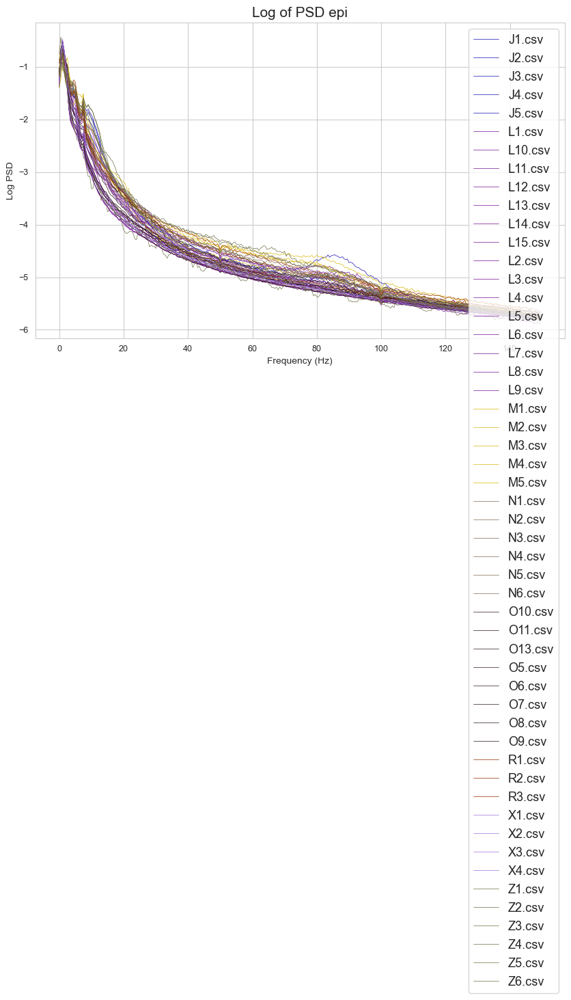

In [12]:
folder_path= 'normalized_psd_epi'
# Leggi tutti i file nella cartella
filenames_epi = sorted([f for f in os.listdir(folder_path) if f.endswith('.csv')], key=lambda x: int(x.split('_')[0]) if x.split('_')[0].isdigit() else float('inf'))

# Crea un DataFrame vuoto per memorizzare tutti i dati
all_data = pd.DataFrame()

plt.figure(figsize=(10, 6))  # Imposta la dimensione del grafico
# Crea un dizionario di colori
colori = {}

for filename in filenames_epi:
    file_path = os.path.join(folder_path, filename)
    
    # Controlla se il file è vuoto
    if os.path.getsize(file_path) == 0:
        print(f"Il file {filename} è vuoto")
        continue

    # Leggi il file CSV
    df = pd.read_csv(file_path)

     # Filtra i dati per mostrare solo i valori inferiori a 150
    data_filtrata = df[df['Frequenza'] <150].copy()
    # Applica il logaritmo ai valori di PSD
    data_filtrata.loc[:, 'Log_PSD'] = np.log10(data_filtrata['PSD'])
    # Se la lettera non è ancora nel dizionario dei colori, genera un colore casuale
    if filename[0] not in colori:
        colori[filename[0]] = "#"+''.join([random.choice('0123456789ABCDEF') for _ in range(6)])

    # Crea un grafico a barre con i dati filtrati
    plt.plot(data_filtrata['Frequenza'], data_filtrata['Log_PSD'], label=filename,color=colori[filename[0]])

# Imposta le etichette degli assi
plt.xlabel('Frequency (Hz)')
plt.ylabel('Log PSD')

# Imposta il titolo del grafico
plt.title('Log of PSD epi')

# Aggiungi una legenda
plt.legend()

# Mostra il grafico
plt.show()
